Importing the necessary libraries:


In [48]:
import pandas as pd
import os
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from tabulate import tabulate
from wordcloud import WordCloud
import matplotlib.pyplot as plt

nltk.download('stopwords')
nltk.download('punkt_tab')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\costi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\costi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\costi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

Setting up the directories

In [49]:
base_dir = os.path.abspath(os.path.join(os.getcwd(), ".."))
src_dir = os.path.join(base_dir, "src")
data_dir = os.path.join(base_dir, "data")
mide22_dir = os.path.join(data_dir, "MiDe22")
dataset_dir = os.path.join(mide22_dir, "dataset/EN")

Creating the dataframe:

In [50]:
event_column_names = [
    'EventNo','Topic','Event','Link','Keywords','Check_Date',
    'Start_Date','End_Date','Other_Keywords','Sample_Tweets'
]

events_df = pd.read_csv(
    f'{dataset_dir}/mide22_en_misinfo_events.csv',
    encoding='utf-8',
    engine='python',
    quotechar='"',
    names=event_column_names,
    on_bad_lines='skip',
    header=0
)

tweets_column_names = ['topic',	'event_id',	'label', 'tweet_id', 'text']

tweets_df = pd.read_csv(
    f'{dataset_dir}/mide22_en_misinfo_tweets.tsv',
    encoding='utf-8',
    engine='python',
    quotechar='"',
    names=tweets_column_names,
    sep='\t',
    on_bad_lines='skip',
    header=0
)

tweets_df.rename(columns={'event_id': 'EventNo'}, inplace=True)

tweets_df['tweet_id'] = tweets_df['tweet_id'].astype(str)
tweets_df['EventNo'] = tweets_df['EventNo'].astype(str).str.strip().str.lower()
events_df['EventNo'] = events_df['EventNo'].astype(str).str.strip().str.lower()
tweets_df['EventNo'] = tweets_df['EventNo'].str.replace(r'^en0*', 'en', regex=True)

df_mide22 = pd.merge(tweets_df, events_df, on='EventNo', how='left', suffixes=('_tweets', '_events'))

df_mide22 = df_mide22[['tweet_id', 'EventNo', 'Topic', 'Event', 'text', 'Keywords', 'Other_Keywords', 'label']]

print(df_mide22.count())
print(df_mide22[['EventNo', 'Topic', 'Event', 'text']].head())

tweet_id          5284
EventNo           5284
Topic             5284
Event             5284
text              5284
Keywords          5284
Other_Keywords    5284
label             5284
dtype: int64
  EventNo    Topic                                              Event  \
0     en1  Ukraine  Russia Embassy in Canada claim that it is not ...   
1     en1  Ukraine  Russia Embassy in Canada claim that it is not ...   
2     en1  Ukraine  Russia Embassy in Canada claim that it is not ...   
3     en1  Ukraine  Russia Embassy in Canada claim that it is not ...   
4     en1  Ukraine  Russia Embassy in Canada claim that it is not ...   

                                                text  
0  And now for the statement from the Russian Emb...  
1  Statement by the Russian Embassy in Canada: ht...  
2  Read the Official statement by the Russian Emb...  
3  OFFICIAL STATEMENT BY RUSSIAN EMBASSY IN CANAD...  
4  Original statement made by the Russian Embassy...  


Label counts:

In [51]:
label_counts = df_mide22['label'].value_counts()
print(tabulate(label_counts.reset_index(), headers=['Label', 'Count'], tablefmt='psql'))

+----+---------+---------+
|    | Label   |   Count |
|----+---------+---------|
|  0 | Other   |    2828 |
|  1 | False   |    1729 |
|  2 | True    |     727 |
+----+---------+---------+


Text count distribution:

In [52]:
df_mide22['text_length'] = df_mide22['text'].apply(lambda x: len(str(x).split()))
df_mide22['char_length'] = df_mide22['text'].apply(lambda x: len(str(x)))

print(tabulate(df_mide22[['text_length','char_length']].describe(), headers='keys', tablefmt='psql'))

+-------+---------------+---------------+
|       |   text_length |   char_length |
|-------+---------------+---------------|
| count |     5284      |     5284      |
| mean  |       31.3872 |      208.961  |
| std   |       14.4449 |       98.6589 |
| min   |        1      |        9      |
| 25%   |       19      |      134      |
| 50%   |       32      |      211.5    |
| 75%   |       43      |      278      |
| max   |      106      |      992      |
+-------+---------------+---------------+


In [53]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

Cleaning the text:

In [54]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"#\w+", "", text)
    text = re.sub(r"http\S+|www\S+|url", "", text)
    text = re.sub(r"@\w+", "", text)
    text = re.sub(r"[^a-z0-9\s]", " ", text)
    text = re.sub(r"\s+", " ", text).strip()

    tokens = nltk.word_tokenize(text)
    tokens = [t for t in tokens if t not in stop_words and len(t) > 2]
    tokens = [lemmatizer.lemmatize(t) for t in tokens]

    return " ".join(tokens)

In [55]:
df_mide22['clean_text'] = df_mide22['text'].apply(clean_text)

In [56]:
print(tabulate(df_mide22.head(), headers='keys', tablefmt='psql'))

+----+---------------------+-----------+---------+-----------------------------------------------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+------------------------+---------+---------------+---------------+----------------------------------------------------------------------------------------+
|    |            tweet_id | EventNo   | Topic   | Event                                                                       | text                                                                                                                              | Keywords                                                                                                                     

In [57]:
print(tabulate(df_mide22[['text','clean_text']].head(), headers='keys', tablefmt='psql'))

+----+-----------------------------------------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------+
|    | text                                                                                                                              | clean_text                                                                             |
|----+-----------------------------------------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------|
|  0 | And now for the statement from the Russian Embassy in Canada... It's abhorrent 😡 https://t.co/wzWkI5w9Xk https://t.co/UFQvstFyNc | statement russian embassy canada abhorrent                                             |
|  1 | Statement by the Russian Embassy in Canada: https://t.co/gCAnEl3ObG               

Cleaning the keywords:

In [58]:
def clean_keywords(keywords):
    if pd.isna(keywords):
        return ""
    keywords = keywords.lower()
    keywords = re.sub(r'[\(\)]', '', keywords)
    keywords = re.sub(r'\bor\b', '', keywords)
    keywords = re.sub(r'\s+', ' ', keywords).strip()
    return keywords

In [59]:
df_mide22['clean_keywords'] = df_mide22['Keywords'].apply(clean_keywords)
df_mide22['clean_other_keywords'] = df_mide22['Other_Keywords'].apply(clean_keywords)

All tweets word cloud:

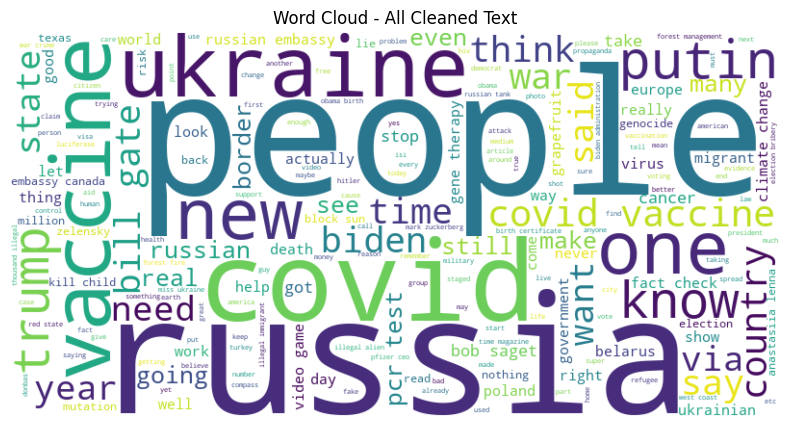

In [60]:
all_text = " ".join(df_mide22['clean_text'])

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud - All Cleaned Text")
plt.show()

Word cloud for each label:


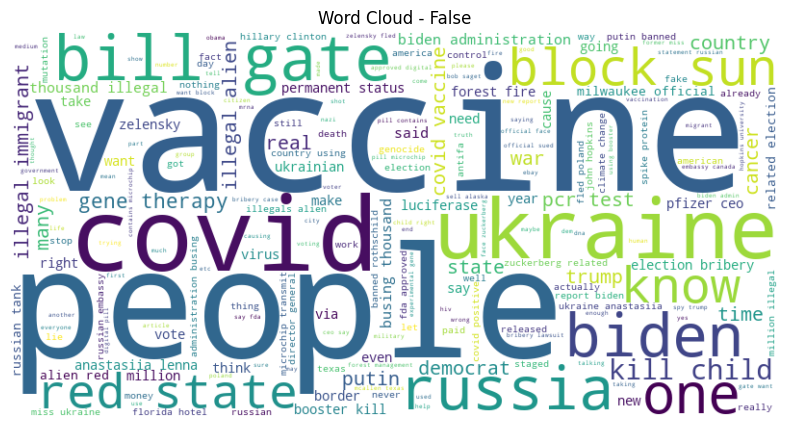

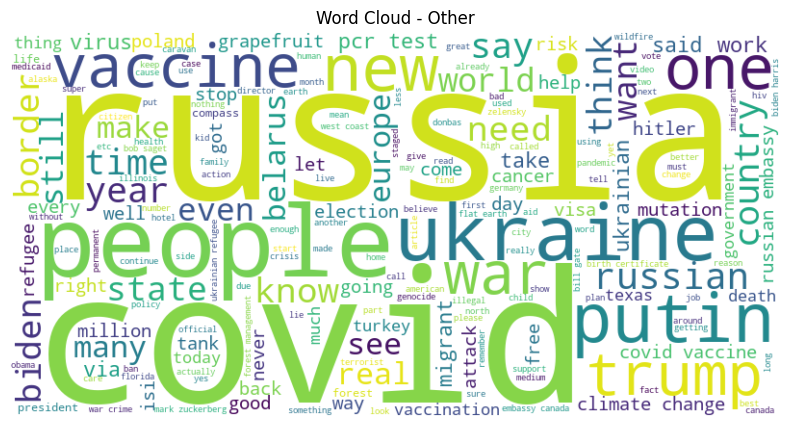

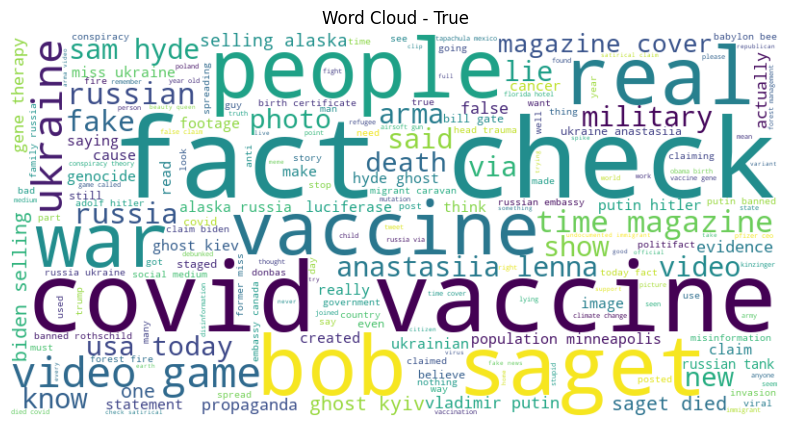

In [61]:
for label in df_mide22['label'].unique():
    subset = df_mide22[df_mide22['label'] == label]
    text = " ".join(subset['clean_text'])
    wc = WordCloud(width=800, height=400, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud - {label}")
    plt.show()

Word cloud for keywords:

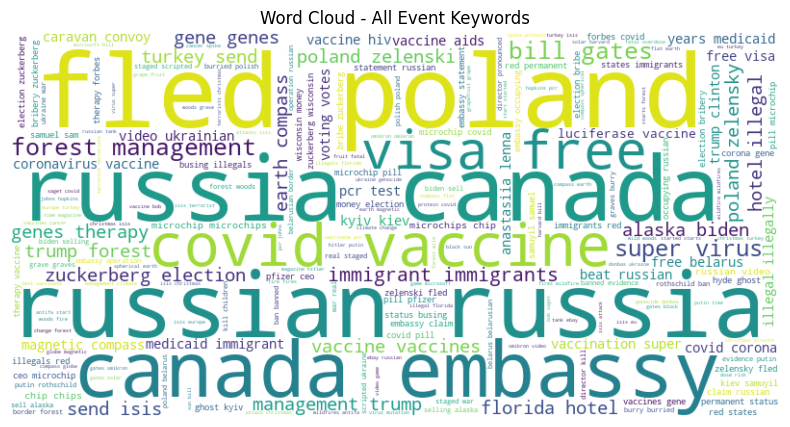

In [62]:
all_keywords = " ".join(df_mide22['clean_keywords'])

wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white'
).generate(all_keywords)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud - All Event Keywords")
plt.show()

Word clouds for each label keywords:

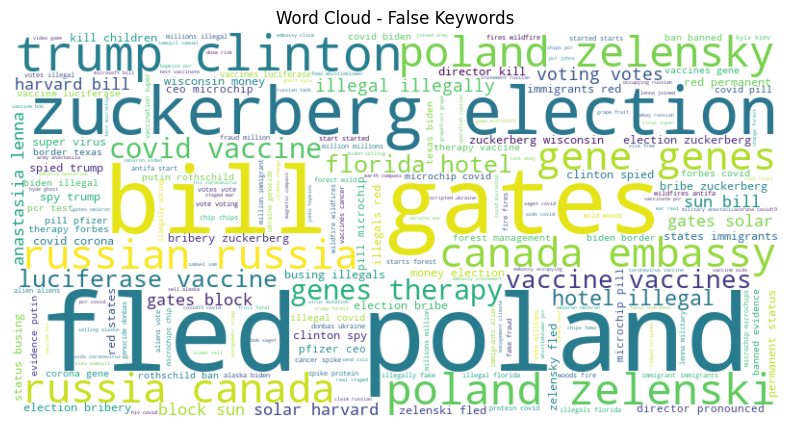

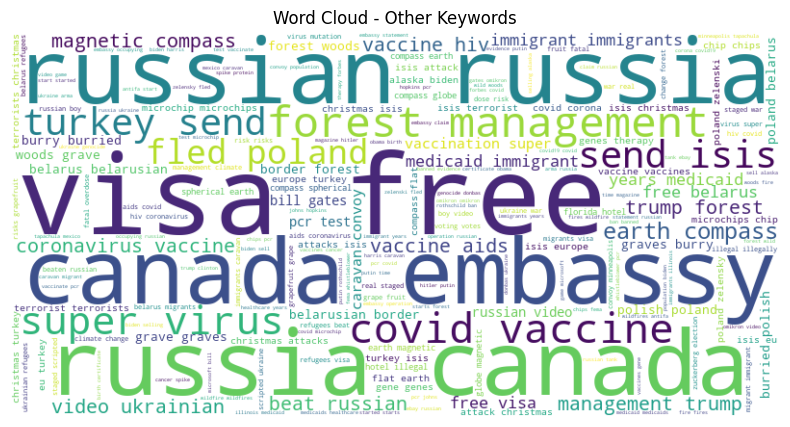

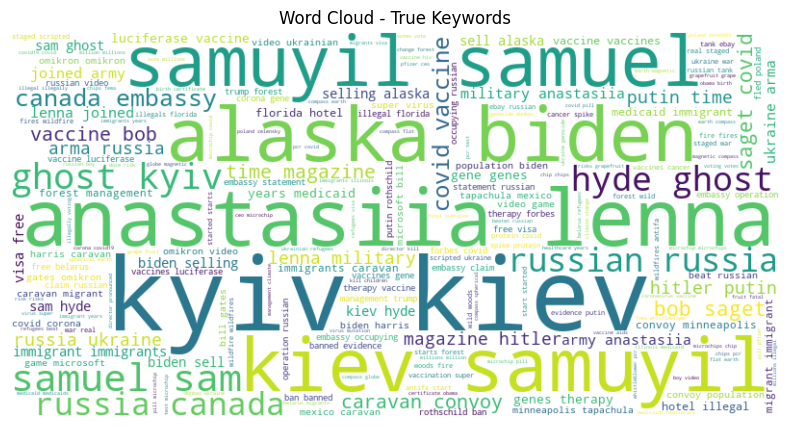

In [63]:
for label in df_mide22['label'].unique():
    subset = df_mide22[df_mide22['label'] == label]
    text = " ".join(subset['clean_keywords'])
    wc = WordCloud(width=800, height=400, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud - {label} Keywords")
    plt.show()

Word clouds by event:

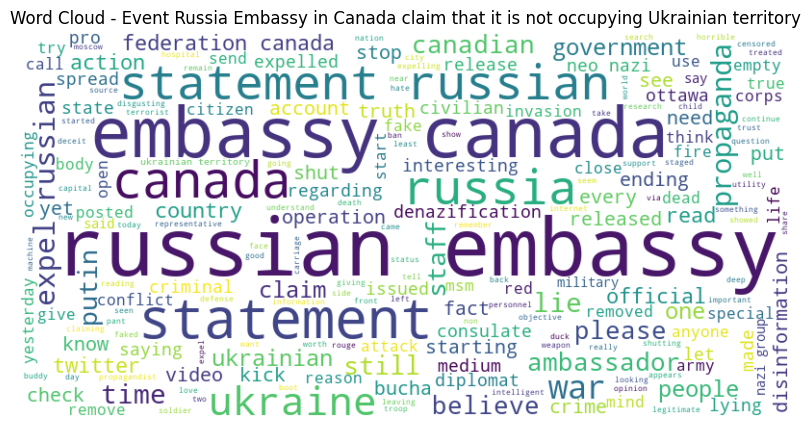

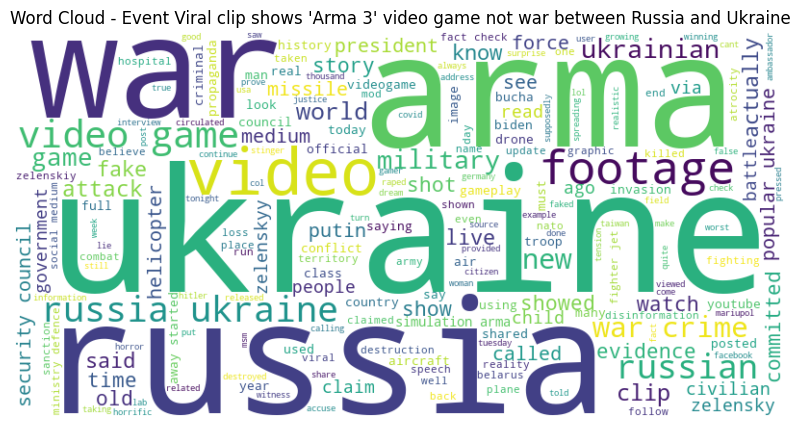

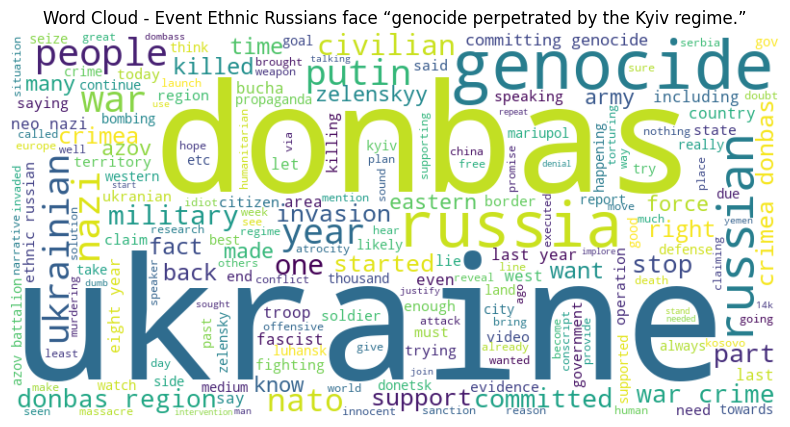

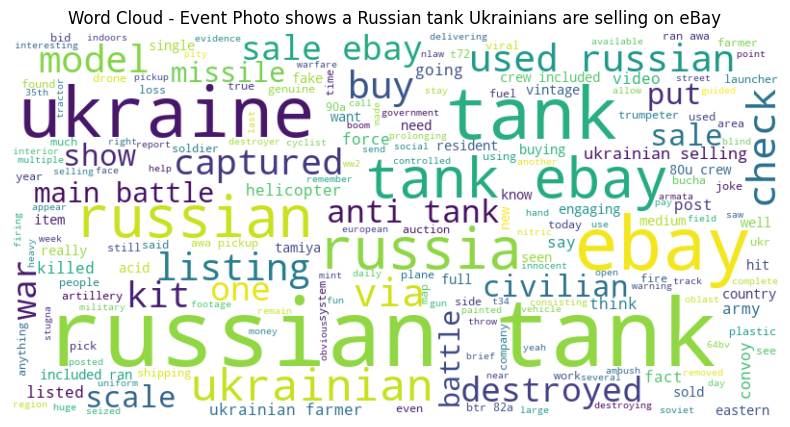

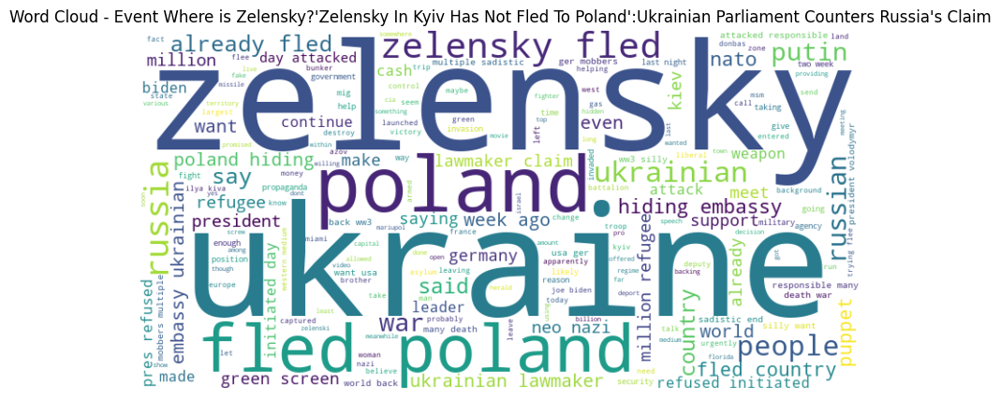

...

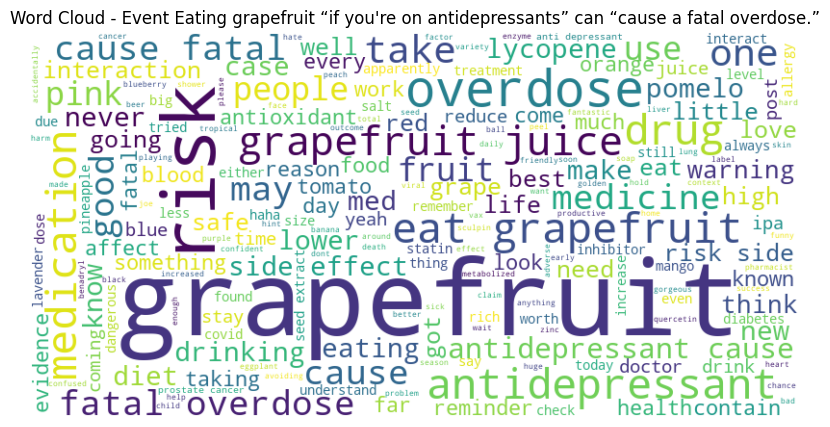

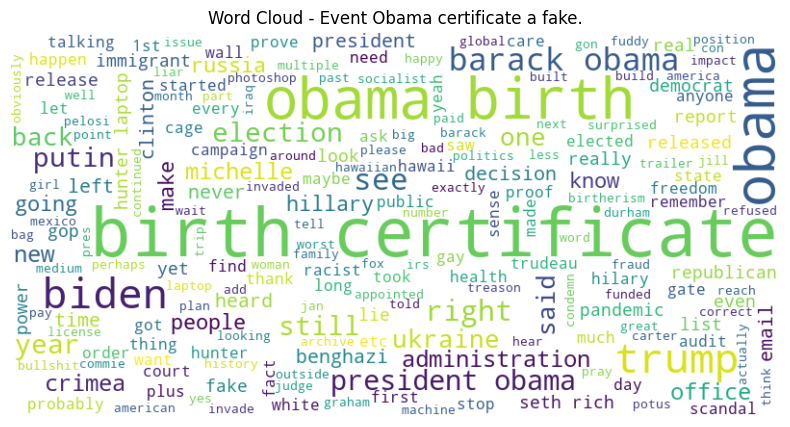

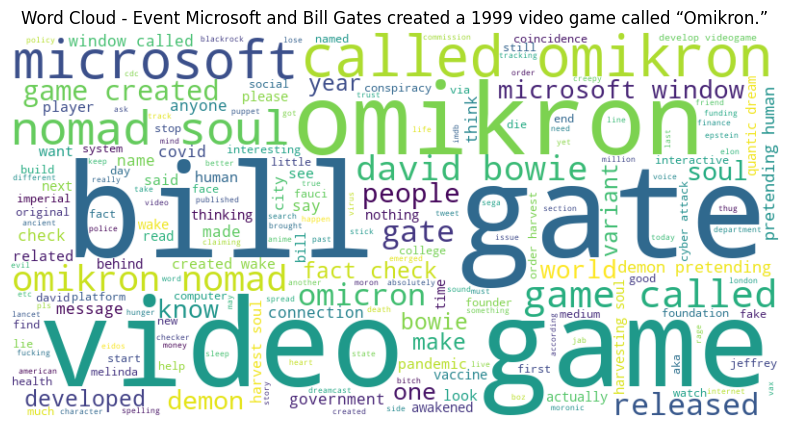

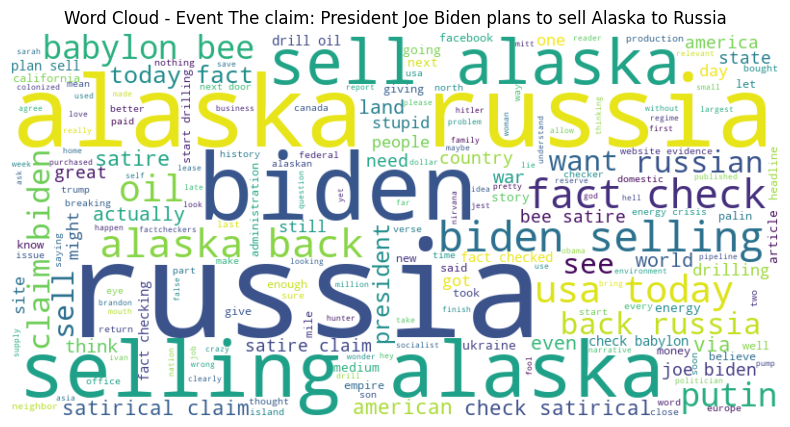

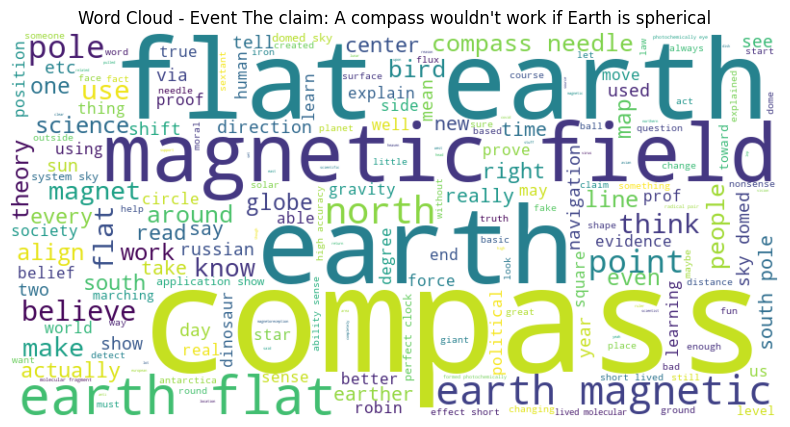

In [64]:
for event in df_mide22['EventNo'].unique():
    subset = df_mide22[df_mide22['EventNo'] == event]
    text = " ".join(subset['clean_text'])

    wc = WordCloud(width=800, height=400, background_color='white').generate(text)
    event_name = subset['Event'].values[0] if not subset.empty else "Unknown Event"

    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud - Event {event_name}")
    plt.show()